In [1]:
import tensorflow as tf
from tensorflow.keras import models,layers,Sequential  
import matplotlib.pyplot as plt
import numpy as np

In [2]:
image = 256
batch = 32
epochs = 50

In [3]:
dataset =tf.keras.preprocessing.image_dataset_from_directory(
    "potato dataset",
    shuffle = True,
    image_size = (image,image),
    batch_size = batch
) 
 

Found 2152 files belonging to 3 classes.


In [4]:
class_what  = dataset.class_names
class_what 

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

In [22]:

for image_batch, label_batch in dataset.take(1):
 print(image_batch.shape)
 print( label_batch.numpy())

(32, 256, 256, 3)
[0 1 1 1 1 1 1 1 0 1 0 1 0 0 2 1 0 0 0 1 2 0 2 1 0 2 0 1 1 1 1 0]


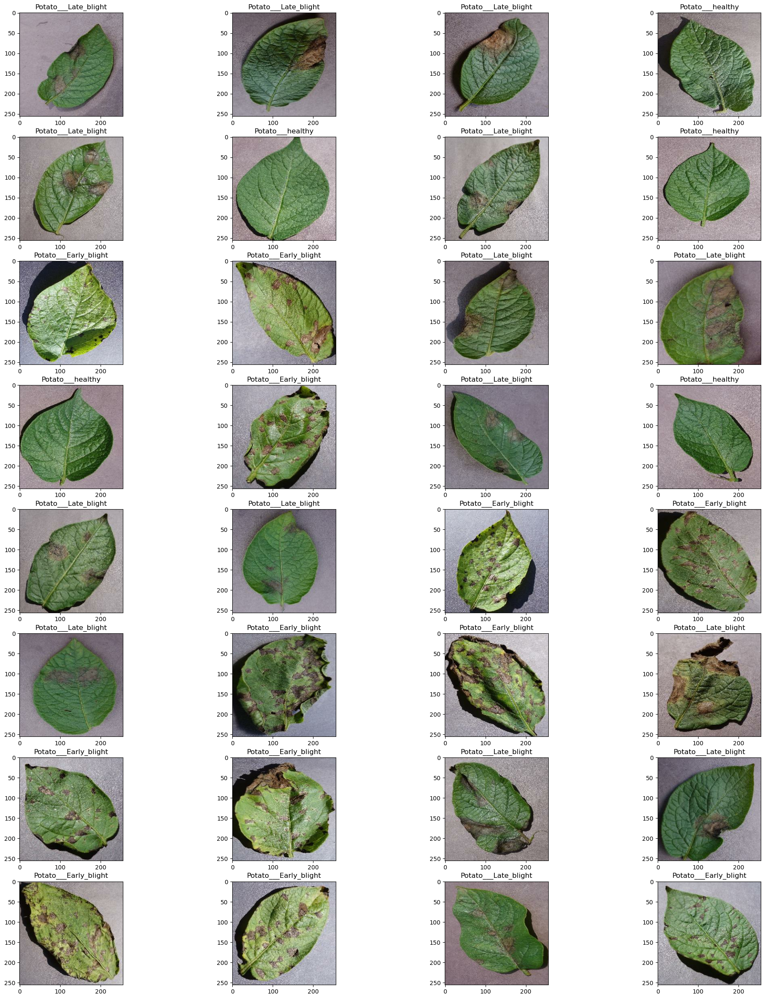

In [6]:

plt.figure(figsize=(25,30))
for image_batch, label_batch in dataset.take(1):
 for i in range(32):
   plt.subplot(8,4,i+1)    
   plt.imshow(image_batch[i].numpy().astype("uint8"))
   plt.title( class_what[label_batch[i]])

In [23]:
len(dataset)

68

In [25]:
batches = len(dataset)
train_split  = 0.8
train_size = int(len(dataset)*train_split)
train_d = dataset.take(train_size)
len(train_d)

54

In [26]:
test_d = dataset.skip(train_size)
len(test_d)


14

In [27]:
validation_split = 0.1
validation_size = int(len(dataset )*validation_split) 
validation_d = test_d.take(validation_size)
len(validation_d)


6

In [28]:

test_d = test_d.skip(validation_size)
len( test_d)

8

In [43]:
def train_test (dataset  , train = 0.8, test =0.1 , validation = 0.1 , shuffle = True , shuffling_size = 1000 ):
    assert(train + test + validation) ==1

    batches = len(dataset) 
    if shuffle:
     dataset = dataset.shuffle(shuffling_size , seed =13) 
     
    train_size = int(len(dataset)*train)
    validation_size = int(len(dataset )*validation) 
    
    train_d = dataset.take(train_size)
    validation_d = dataset.skip(train_size).take(validation_size)
    test_d = dataset.skip(train_size).skip(validation_size)
    
    
    
    return train_d, test_d , validation_d  


In [11]:
train_d, test_d , validation_d = train_test( dataset)
train_d = train_d.cache().shuffle(900).prefetch(buffer_size=tf.data.AUTOTUNE )
validation_d = validation_d.cache(900).shuffle(900).prefetch(buffer_size=tf.data.AUTOTUNE)
test_d = test_d.cache().shuffle(900).prefetch(buffer_size=tf.data.AUTOTUNE)

In [31]:
resize_image = tf.keras.Sequential([
    layers.Resizing(image,image),
    layers.Rescaling(1.0/255)
])

In [32]:
augmentation = tf.keras.Sequential([
    layers.RandomFlip( "horizontal_and_vertical"),
    layers.RandomRotation( 0.2),
])

In [33]:
train_d = train_d.map(
    lambda x, y: (augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)

In [54]:
colour =3; 
input = (batches ,image,image,colour)

model = models.Sequential([
    resize_image,
    augmentation,
    layers.Conv2D(64 ,(3,3), activation = 'relu' , input_shape = input ),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3), activation = 'relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64 ,(3,3), activation = 'relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64 ,(3,3), activation = 'relu' ),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64 ,(3,3), activation = 'relu' ),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64 ,(3,3), activation = 'relu' ),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense( 64 , activation ='relu'),
    layers.Dense( colour,  activation ='softmax')
   
]) 
model.build ( input_shape =  input)

d:\Users\Arnav Singh\.conda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [55]:
model.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_3 (Sequential)       │ (68, 256, 256, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_4 (Sequential)       │ (68, 256, 256, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_30 (Conv2D)              │ (68, 254, 254, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_30 (MaxPooling2D) │ (68, 127, 127, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_31 (Conv2D)              │ (68, 125, 125, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_31 (MaxPooling2D) │ (68, 62, 62, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_32 (Conv2D)              │ (68, 60, 60, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_32 (MaxPooling2D) │ (68, 30, 30, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_33 (Conv2D)              │ (68, 28, 28, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_33 (MaxPooling2D) │ (68, 14, 14, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_34 (Conv2D)              │ (68, 12, 12, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_34 (MaxPooling2D) │ (68, 6, 6, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_35 (Conv2D)              │ (68, 4, 4, 64)         │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_35 (MaxPooling2D) │ (68, 2, 2, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (68, 256)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (68, 64)               │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (68, 3)                │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 203,075 (793.26 KB)

 Trainable params: 203,075 (793.26 KB)

 Non-trainable params: 0 (0.00 B)

In [56]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)


In [57]:
training_history = model.fit (
    train_d,
    epochs = epochs,
    batch_size = batches,
    verbose = 1, 
    validation_data = validation_d,
    
    
)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 89s 2s/step - accuracy: 0.5153 - loss: 0.9184 - val_accuracy: 0.7240 - val_loss: 0.6871
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 87s 2s/step - accuracy: 0.5798 - loss: 0.8541 - val_accuracy: 0.4948 - val_loss: 0.9164
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 95s 2s/step - accuracy: 0.4971 - loss: 0.8853 - val_accuracy: 0.6510 - val_loss: 0.7935
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - accuracy: 0.6909 - loss: 0.6770 - val_accuracy: 0.8125 - val_loss: 0.4984
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 91s 2s/step - accuracy: 0.8095 - loss: 0.4691 - val_accuracy: 0.8385 - val_loss: 0.3585
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 128s 2s/step - accuracy: 0.8709 - loss: 0.3367 - val_accuracy: 0.8906 - val_loss: 0.2426
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 138s 3s/step - accuracy: 0.8953 - loss: 0.2870 - val_accuracy: 0.9062 - val_loss: 0.2642
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 124s 2s/step - accuracy: 0.9158 - loss: 0.2052 - val_accuracy: 0.8750 - val_lo

In [58]:
test_score = model.evaluate(test_d) 

test_score 


8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 346ms/step - accuracy: 0.9553 - loss: 0.1345


[0.10943259298801422, 0.9612069129943848]

In [59]:
training_history 
training_history.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [60]:
#assigning values for plotting 
accuracy = training_history.history['accuracy']
validation_accuracy =  training_history.history['val_accuracy']

loss =  training_history.history['loss']
validation_loss =  training_history.history['val_loss']

Text(0.5, 1.0, 'Traning and valiadtion loss graph')

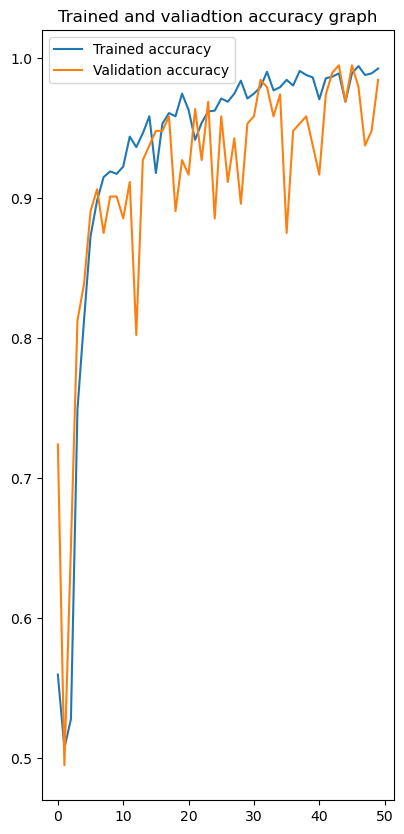

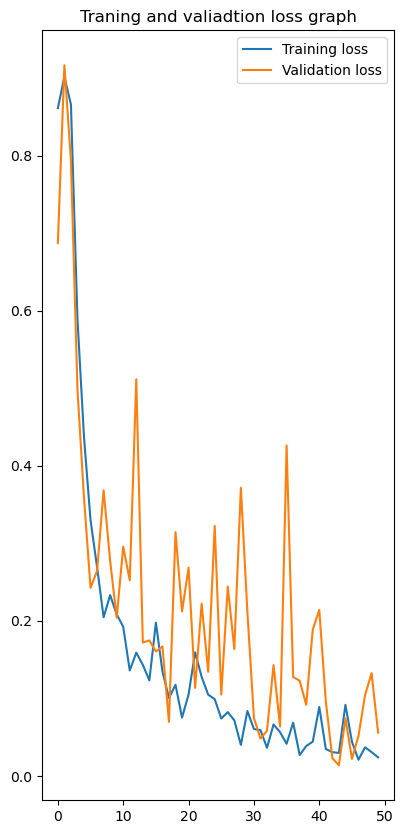

In [62]:
#plottig 
plt.figure(figsize =(10,10))
plt.subplot( 1,2,1)
plt.plot(range(epochs) , accuracy , label = 'Trained accuracy' )
plt.plot(range(epochs), validation_accuracy, label = 'Validation accuracy' )
plt.legend()
plt.title( 'Trained and valiadtion accuracy graph')\
    
    

plt.figure(figsize =(10,10))
plt.subplot( 1,2,2)
plt.plot(range(epochs) , loss , label = 'Training loss' )
plt.plot(range(epochs), validation_loss, label = 'Validation loss' )
plt.legend()
plt.title( 'Traning and valiadtion loss graph')

predicting image 
name of the disease  Potato___Late_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
Prediction: Potato___Late_blight


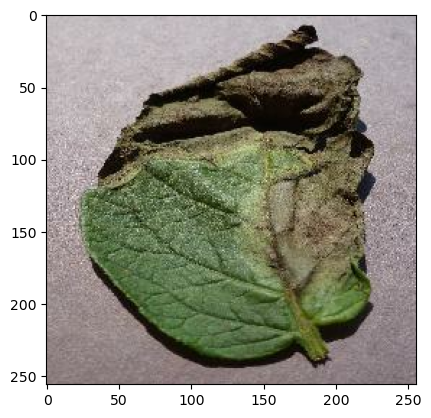

In [74]:
for image_batch , label_batch in dataset.take(1):
    first = image_batch[0].numpy().astype('uint8')
    firstlabel = label_batch[0].numpy()
    
print( "predicting image ")
plt.imshow(first)
print( "name of the disease " , class_what[firstlabel] )



# Make predictions on the batch of images
predictions = model.predict(image_batch)

# Get the predicted class index for the first image in the batch
predicted_class_index = np.argmax(predictions[0])

# Map the predicted class index to the corresponding class name
predicted_class_name = class_what[predicted_class_index]

# Print the predicted class name
print("Prediction:", predicted_class_name)


In [107]:

def predicting_images(model,img ):
    array_of_image = tf.keras.preprocessing.image.img_to_array(image[i].numpy())
    array_of_image = tf.expand_dims(array_of_image, 0)
    
    predict = model.predict(array_of_image)
    
    predicted_class_index = np.argmax(predict[0])
    predicted_class = class_what[predicted_class_index]
    confidence = round(100 * (np.max(predict[0])),2)
    return predicted_class, confidence




1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


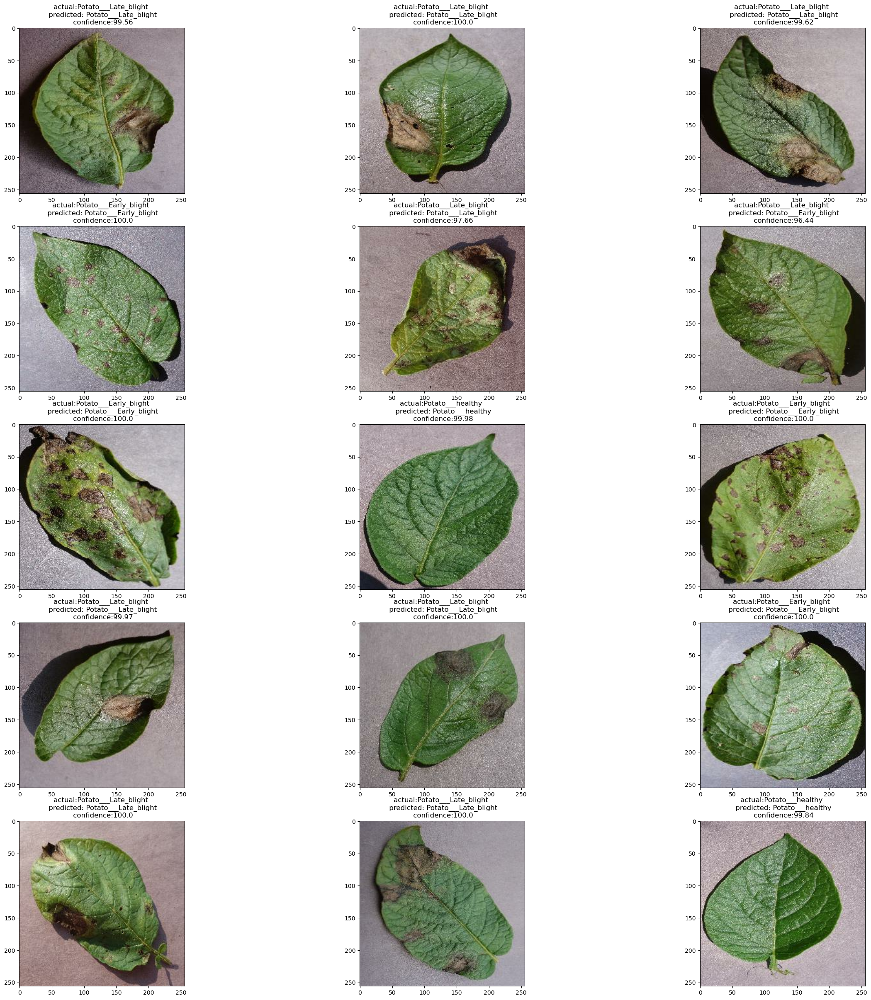

In [109]:



plt.figure(figsize=(30, 30))
for image, label in test_d.take(1):
    for i in range(15):  # Adjusted to 15 to match subplot layout
        plt.subplot(5, 3, i + 1)
        plt.imshow(image[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predicting_images(model,image[i])
        original_class_name = class_what[label[i]]
        
        plt.title(f"actual:{original_class_name} \n predicted: {predicted_class}\n confidence:{confidence}")


plt.show()
        

In [111]:
from tensorflow.keras.models import load_model
model.save('C:/Users/Arnav Singh/OneDrive/Desktop/Potato Disease/models/new_model[2].keras')